In [1]:
%matplotlib widget
import os
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow import keras
from keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import load_model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

In [2]:
dataset_folder = r"C:\Users\sowmy\Downloads\Final_data_weekly-20230531T131841Z-001\Final_data_weekly\Final_Data_week_1\Mackerel\Mackerel"
fish_type = ['Good', 'Bad']
IMAGE_SIZE = 224
label_map = {species:i for i,species in enumerate(fish_type)}

In [3]:
label_map

{'Good': 0, 'Bad': 1}

In [ ]:
IMAGE_SIZE = 224      # 299 for InceptionV3
target_size = (IMAGE_SIZE, IMAGE_SIZE)

def preprocess_folder_images(dataset_folder):
    images = []
    labels = []
    for folder in fish_type:
        folder_path = os.path.join(dataset_folder, folder)
        if os.path.isdir(folder_path):
            for file in tqdm(os.listdir(folder_path), desc=f'Loading {folder} images '):
                filepath = os.path.join(folder_path, file)
                if os.path.isfile(filepath):
                    image = cv2.imread(filepath)
                    if image is not None:
                        image = cv2.resize(image, target_size)/255.0
                        images.append(image)
                        labels.append(label_map[folder])
    images = np.array(images)
    labels = np.array(labels)
    return images, labels

images, labels = preprocess_folder_images(dataset_folder)

Loading Bad images : 100%|██████████| 137/137 [00:23<00:00,  5.76it/s]


In [5]:
train_images, val_images, train_labels, val_labels = train_test_split(images, 
                                                                        labels, 
                                                                        test_size=0.2, 
                                                                        random_state=24, 
                                                                        # random_state=42,
                                                                        stratify=labels)

In [6]:
train_images.shape, val_images.shape

((211, 224, 224, 3), (53, 224, 224, 3))

In [7]:
train_labels.shape, val_labels.shape

((211,), (53,))

In [8]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rotation_range=20,
                        horizontal_flip=True,
                        vertical_flip=True,
                        fill_mode='nearest')

In [9]:
from keras.applications import MobileNetV2
base_model = MobileNetV2(weights='imagenet', 
                   include_top=False, 
                   input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

In [10]:
# Freeze the pre-trained layers so they are not updated during training
for layer in base_model.layers:
    layer.trainable = False  

In [11]:
# Add a new classification head on top of the pre-trained layers
model = keras.Sequential([
    base_model,
    layers.Flatten(),
    # layers.Dense(units=50, activation='relu'),
    # layers.Dense(units=64, activation='relu'),
    # layers.Dropout(0.2),  # Add dropout layer with a dropout rate of 0.2
    # layers.Dense(units=64, activation='relu'),
    
    layers.Dense(units=40, activation='relu'),
    layers.Dense(units=50, activation='relu'),
    layers.Dense(units=50, activation='relu'),
    layers.Dense(2, activation='softmax')
])


In [12]:
# Compile the model
model.compile(optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

In [13]:
import keras
import numpy as np

class CustomCheckpoint(keras.callbacks.Callback):
    def __init__(self, filepath):
        super(CustomCheckpoint, self).__init__()
        self.filepath = filepath
        self.best_train_acc = -np.Inf
        self.best_val_acc = -np.Inf

    def on_epoch_end(self, epoch, logs=None):
        current_train_acc = logs.get('accuracy')
        current_val_acc = logs.get('val_accuracy')

        if current_train_acc > self.best_train_acc and current_val_acc > self.best_val_acc:
            self.best_train_acc = current_train_acc
            self.best_val_acc = current_val_acc
            self.model.save(self.filepath)
            print(" Model saved.")

# Create the custom callback
checkpoint_callback = CustomCheckpoint(filepath=dataset_folder+'\model.h5')


In [ ]:
EPOCHS = 25
BATCH_SIZE = 32
history = model.fit(
    # train_images, train_labels,
    datagen.flow(train_images, train_labels), 
    epochs=EPOCHS,
    validation_data=(val_images, val_labels),
    callbacks=[checkpoint_callback]
    )

In [ ]:
def acc_loss_plots(model_history=history):
    train_accuracy = history.history['accuracy']
    train_loss = history.history['loss']
    val_accuracy = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    # Create an array of epoch numbers
    EPOCHS = range(1, len(train_accuracy) + 1)

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 5))

    # Plot accuracy vs epochs
    ax1.plot(EPOCHS, train_accuracy, 'r.-', label='Train_Accuracy')
    ax1.plot(EPOCHS, val_accuracy, 'b.-', label='Val_Accuracy')

    ax1.set_ylabel('Accuracy')
    ax1.set_title('Epochs vs Accuracy')
    ax1.legend()

    # Plot loss vs epochs
    ax2.plot(EPOCHS, train_loss, 'r.-', label='Train_Loss')
    ax2.plot(EPOCHS, val_loss, 'b.-', label='Val_Loss')

    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.set_title('Epochs vs Loss')
    ax2.legend()

    # Add additional vertical spacing between subplots
    plt.subplots_adjust(wspace=0, hspace=1)
    plt.tight_layout()
    plt.show()

acc_loss_plots()

In [16]:
def show_image(index, img_arr=val_images, labels_arr=val_labels):
    image = (img_arr[index] * 255).astype('uint8')
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize = (3,3))
    plt.imshow(image_rgb)
    plt.title(fish_type[labels_arr[index]])
    plt.tight_layout()
    plt.axis('off')
    plt.show()


In [17]:
def show_predictions(model, img_arr=val_images, labels_arr=val_labels):
    predictions = model.predict(img_arr)
    confidence = np.array([np.max(pred) for pred in predictions])
    predictions = np.array([np.argmax(pred) for pred in predictions])

    # Calculate the number of rows and columns based on the number of images
    num_images = len(img_arr)
    num_rows = int(np.ceil(num_images / 4))  
    num_cols = 4  

    # Calculate the size of the figure based on the desired image size
    fig_width = 16  
    fig_height = 4 * num_rows  

    # Create a figure and axes for subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, 
                             figsize=(fig_width, fig_height))

    # Iterate over val_images and display each image in a subplot
    for i in range(num_rows * num_cols):
        if i < num_images:
            image = img_arr[i]

            title = f"Actual: {fish_type[labels_arr[i]]}\
            \nPredicted: {fish_type[predictions[i]]}\
            \nConfidence: {int(confidence[i]*100)}%"

            image_rgb = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_BGR2RGB)
            row = i // num_cols  # Calculate the row index
            col = i % num_cols  # Calculate the column index
            axes[row, col].imshow(image_rgb)
            # axes[row, col].set_title(f"Actual: {fish_type[val_labels[i]]}")
            axes[row, col].set_title(title)
            axes[row, col].axis('off')
            axes[row, col].set_aspect('auto')  # Set the aspect ratio of the axes
        else:
            axes.flat[i].axis('off')  # Add empty plot for remaining subplots

    plt.subplots_adjust(wspace=0, hspace=0)  # Adjust the spacing between subplots
    plt.tight_layout()  # Optional: Adjust the layout to avoid overlapping subplots
    plt.show()

In [18]:
def metrics(model, val_images=val_images, val_labels=val_labels): 
    predictions = model.predict(val_images)
    predictions = np.array([np.argmax(pred) for pred in predictions])

    # Generate confusion matrix
    cm = confusion_matrix(val_labels, predictions)

    # Plot the confusion matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', \
              xticklabels=fish_type, yticklabels=fish_type)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.tight_layout()
    plt.show()

    test_species = [fish_type[label] for label in val_labels]
    predicted_species = [fish_type[label] for label in predictions]

    # Calculate classification metrics 
    report = classification_report(test_species, predicted_species, zero_division=1)
    print("\n",report)

In [ ]:
m = load_model(r"model94.h5")
# m = model

In [97]:
m.evaluate(val_images, val_labels)

2/2 [==============================] - 2s 346ms/step - loss: 0.2782 - accuracy: 0.9434


[0.2782105505466461, 0.9433962106704712]

In [98]:
m.evaluate(train_images, train_labels)

7/7 [==============================] - 3s 440ms/step - loss: 0.1060 - accuracy: 0.9716


[0.10596279054880142, 0.971563994884491]

In [99]:
m.evaluate(images, labels)

9/9 [==============================] - 5s 480ms/step - loss: 0.1405 - accuracy: 0.9659


[0.14054284989833832, 0.9659090638160706]

2/2 [==============================] - 4s 345ms/step


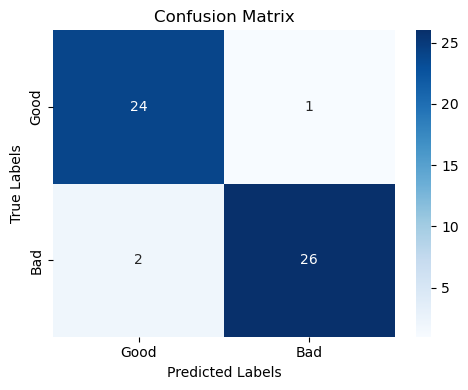


               precision    recall  f1-score   support

         Bad       0.96      0.93      0.95        28
        Good       0.92      0.96      0.94        25

    accuracy                           0.94        53
   macro avg       0.94      0.94      0.94        53
weighted avg       0.94      0.94      0.94        53



In [ ]:
metrics(m)

In [ ]:
show_predictions(m, val_images, val_labels)

2/2 [==============================] - 1s 345ms/step
